In [1]:
import matplotlib.pyplot as plt
import numpy
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as py
import scipy.sparse as sparse
import scipy.sparse.linalg as linalg
from ipywidgets import interact, SelectionSlider
from IPython.display import Image, display
from plotly.subplots import make_subplots
pio.renderers.default = "notebook_connected"
py.offline.init_notebook_mode()

## Numerical Analysis of 2D Diffusion-Reaction Equations Using an Implicit-Explicit Method: Solution and Visualization

**Author:** Kyra Cho

**Note:** The interactive version is found at https://kyracho.github.io/content/int_diffusion_reaction.html

* **Overview:** This is a showcase of a hybrid implicit-explicit method to solve the diffusion-reaction PDE in 2-dimensions. It uses Plotly to provide a stroboscopic and interactive visualization of the solution.


* **Connection to data science:** The PDE has indirect connections to time-series analysis and forecasting. The diffusion equation can be used to smooth time-series data, removing short-term fluctuations while preserving long-term trends, analogous to applying a low-pass filter. 

* **Why use a hybrid method?:** Explicit methods are generally faster than implicit methods, except when the timestep needs to be very small to ensure stability. The diffusion term involves second spatial derivatives, which tend to amplify numerical errors in explicit methods like Forward Euler. The stability criterion for the diffusion term is $\Delta t=\frac{\Delta x^2}{4D}$, where $D$ is the diffusion coefficient. This requires small time steps, making the method not time-efficient. The second derivative term is solved implicitly, allowing for larger time steps without compromising stability, while the reaction term is handled explicitly, reducing the method's time complexity. The hybrid implicit-explicit method is faster than using either a purely implicit or purely explicit method

## The Implicit-Explicit Method: 
The PDE is

\begin{aligned}
    u_t &= \sigma D_1 (\partial_{xx}+\partial_{yy})u + f(u, v) \\
    v_t &= \sigma D_2 (\partial_{xx}+\partial_{yy})v + g(u, v)
\end{aligned}

with the reaction terms 

\begin{aligned}
    f(u,v) &= \alpha u (1 - \tau_1 v^2) + v (1 - \tau_2 u) \\
    g(u,v) &= \beta v + \alpha \tau_1 u v^2 + u (\gamma + \tau_2 v).
\end{aligned}

The system is highly nonlinear due to the terms $uv^2$, $uv$, and $vu^2$. finding an analytical solution to the system is very challenging and maybe impossible. 

    
The following numerical method solves the PDE over the square domain $\{(x,y):-1\leq x,y\leq1\}$ with periodic boundary conditions. 

Numerical method:

\begin{aligned}
    U^\ast &= U^n + \Delta t \sigma D_1 (\partial_{xx}+\partial_{yy}) U^\ast \\
    V^\ast &= V^n + \Delta t \sigma D_2 (\partial_{xx}+\partial_{yy}) V^\ast \\
    U^{n+1} &= U^\ast + \Delta t f(U^\ast, V^\ast) \\
    V^{n+1} &= V^\ast + \Delta t g(U^\ast, V^\ast).
\end{aligned}

$U(x,y,t)$ and $V(x,y,t)$ are coupled $2$-d solutions. In physics, they could represent concentrations of two chemicals in a solution.

In [2]:
# discretize the spacial derivative using a five-point stencil in 2d and return a sparse matrix representation
def laplacian_discretization(m):
    """Constructs a sparse matrix that discretizes the 2d Laplacian
    Uses a five-point stencil and periodic boundary conditions.
    """
    delta_x = 2.0 / (m + 1)
    
    # primary discretization
    e = numpy.ones(m)
    T = sparse.spdiags([e, -4.0 * e, e], [-1, 0, 1], m, m)
    S = sparse.spdiags([e, e], [-1, 1], m, m)
    I = sparse.eye(m)
    A = sparse.kron(I, T) + sparse.kron(S, I)
    
    # construct periodic BCs
    e = numpy.ones(m**2)
    A_periodic = sparse.spdiags([e, e],[m - m**2, m**2 - m], m**2, m**2).tolil()
    
    # left & right BCs:
    for i in range(m):
        A_periodic[i * m, (i + 1) * m - 1] = 1.0
        A_periodic[(i + 1) * m - 1, i * m] = 1.0
    
    # combine two matrices
    A = A + A_periodic
    A /= delta_x**2
    A = A.todia()
    
    return A

In [3]:
# define the two reaction terms
def f_reaction(U, V, sigma, tau_1, tau_2, alpha, beta, gamma):
    return alpha * U * (1.0 - tau_1 * V**2) + V * (1.0 - tau_2 * U)
def g_reaction(U, V, sigma, tau_1, tau_2, alpha, beta, gamma):
    return beta * V * (1.0 + alpha * tau_1 / beta * U * V) + U * (gamma + tau_2 * V)

# build the explicit componenet
def forward_euler_step(U, V, delta_t, A, sigma, f, g, D1=0.5, D2=1.0):
    """Take a single forward Euler step on the reaction-diffusion equation"""
    
    U_new = U + delta_t * (sigma * D1 * A * U + f(U, V))
    V_new = V + delta_t * (sigma * D2 * A * V + g(U, V))
    
    return U_new, V_new
# build the implicit component 
def backward_euler_diffusion_step(U, V, A, delta_t, sigma, D_1, D_2):
    """Take a single backward Euler step on the reaction-diffusion equation"""
    U = linalg.spsolve((sparse.eye(A.shape[0]) - delta_t * sigma * D_1 * A), U)
    V = linalg.spsolve((sparse.eye(A.shape[0]) - delta_t * sigma * D_2 * A), V)
    return U, V

# combine the pieces 
def imex_solver(sigma, tau_1, tau_2, alpha, beta, gamma, D_1, D_2):
    # alias reaction functions with the above parameters
    f = lambda U, V: f_reaction(U, V, sigma, tau_1, tau_2, alpha, beta, gamma)
    g = lambda U, V: g_reaction(U, V, sigma, tau_1, tau_2, alpha, beta, gamma)

    # set up grid
    m = 150
    delta_x = 2.0 / m
    x = numpy.linspace(-1.0, 1.0, m)
    y = numpy.linspace(-1.0, 1.0, m)
    Y, X = numpy.meshgrid(y, x)

    # initial data
    U = numpy.random.randn(m, m) / 2.0
    V = numpy.random.randn(m, m) / 2.0

    # setup spatial discretization
    U = U.reshape(-1)
    V = V.reshape(-1)
    A = laplacian_discretization(m)

    # time
    t = 0.0
    t_final = 30.0
    delta_t = delta_x / (10.0 * sigma)
    num_steps = int(numpy.round(t_final / delta_t))

    data = []
    data.append([x,y,U, t, V])
    
    # evolve in time
    next_output_time = 0.0
    for j in range(num_steps):
        U, V = backward_euler_diffusion_step(U, V, A, delta_t, sigma, D_1, D_2)
        U, V = forward_euler_step(U, V, delta_t, A, sigma, f, g)   
        t += delta_t

        if t >= next_output_time:
            next_output_time += 5.0
            U_output = U.reshape((m, m))
            V_output = V.reshape((m, m))
            data.append([x,y,U_output, t, V_output])

    plt.show()
    return data

# Try different parameters
#data = imex_solver(sigma=0.0021, tau_1=3.5, tau_2=0, alpha=0.899, beta=-0.91, gamma=-0.899, D_1=0.5, D_2=1.0)
data = imex_solver(sigma=0.0045, tau_1=2.02, tau_2=0, alpha=2.0, beta=-0.91, gamma=-2, D_1 = .5, D_2=1)
#data = imex_solver(sigma=0.0045, tau_1=2.02, tau_2=0, alpha=2.0, beta=-0.91, gamma=-2, D_1=.5, D_2=1)
print('Checkpoint reached')

Checkpoint reached


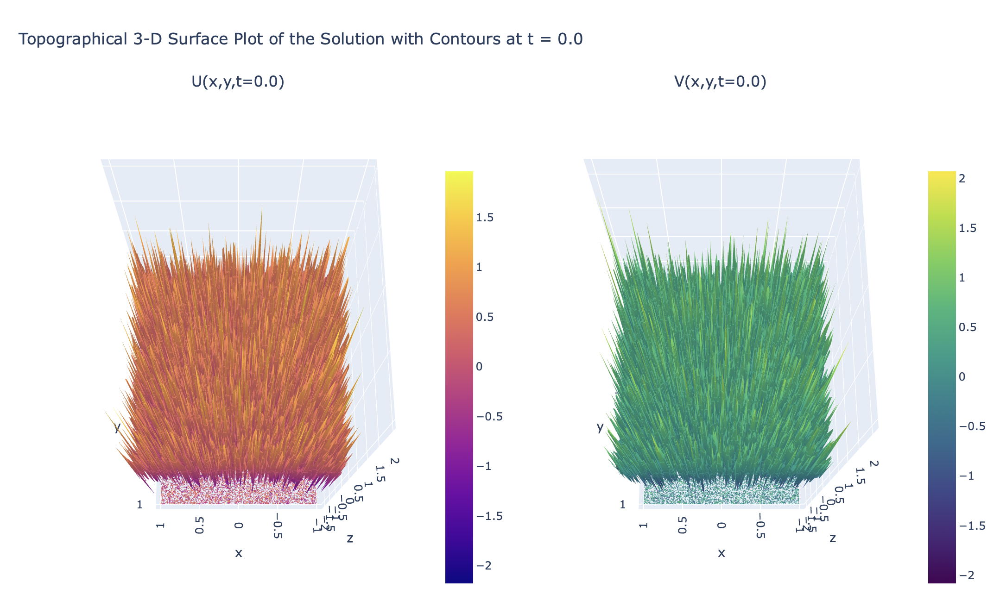

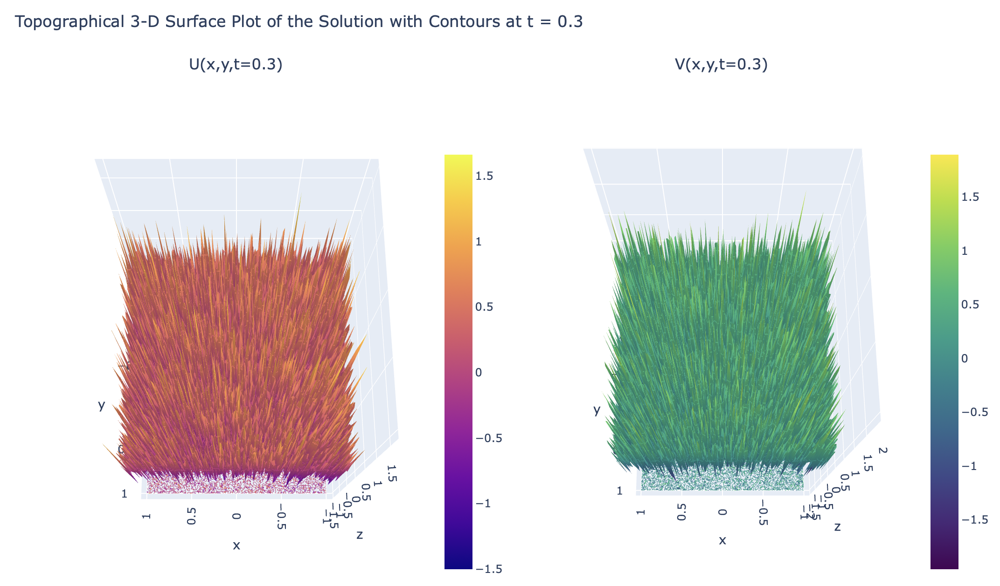

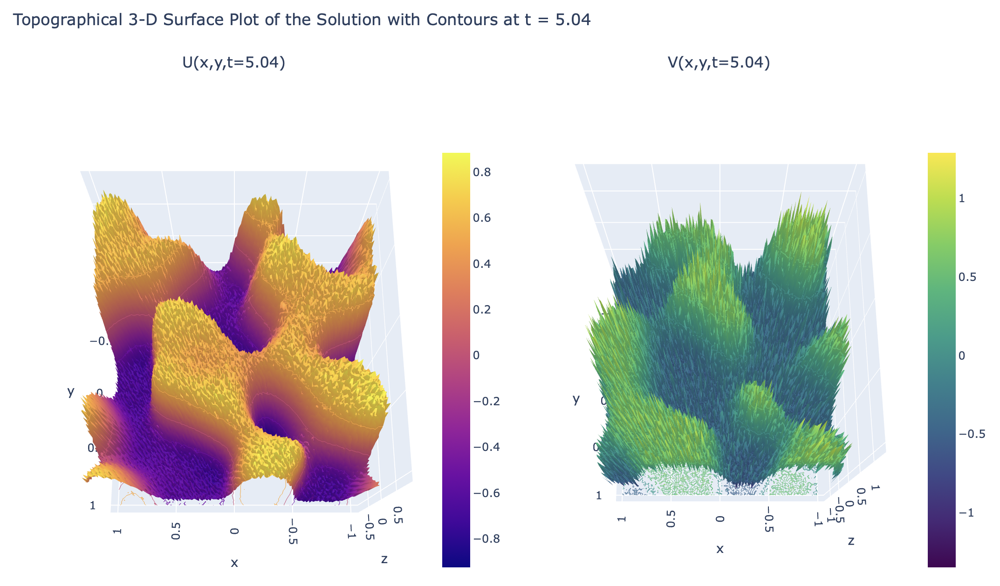

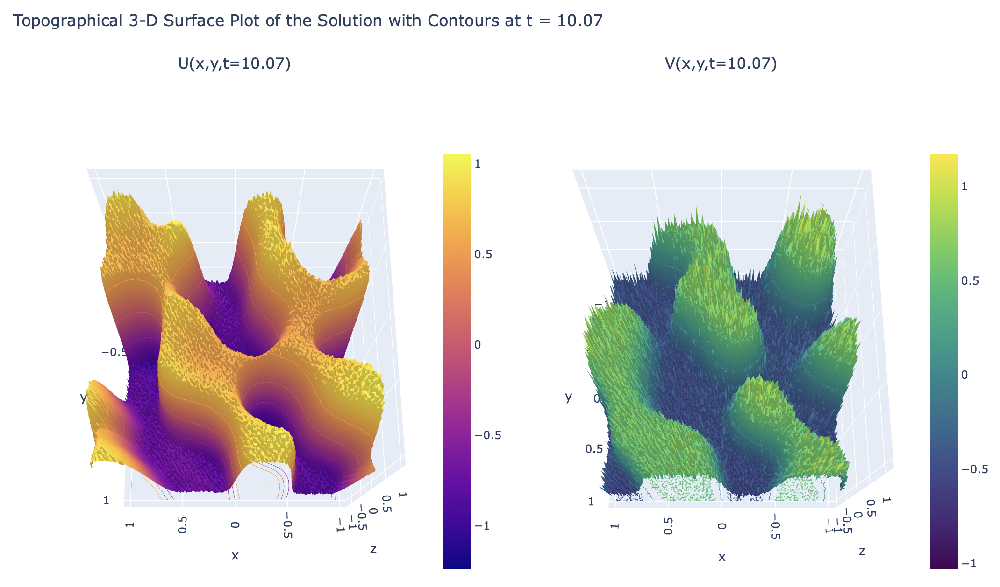

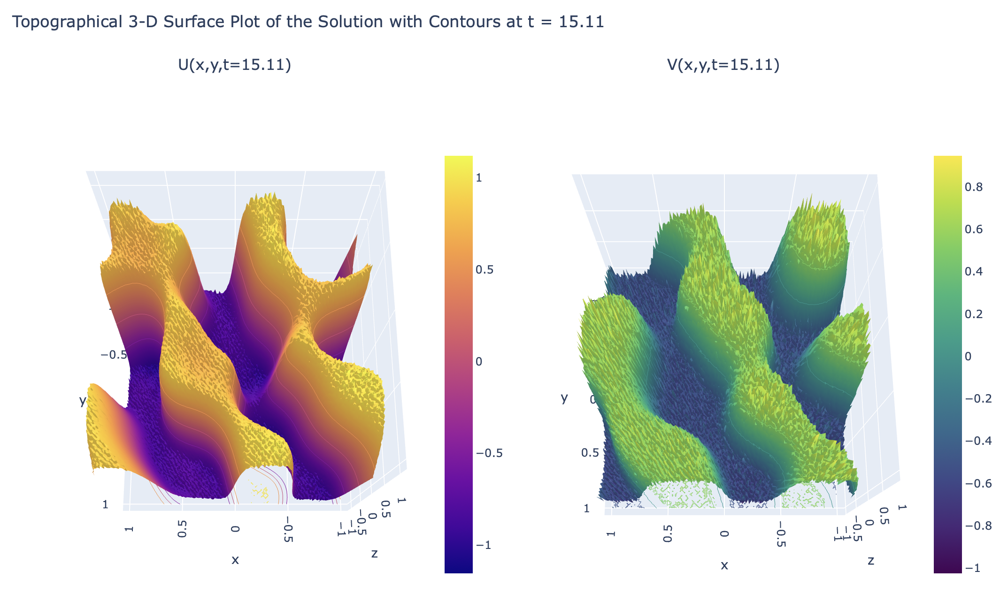

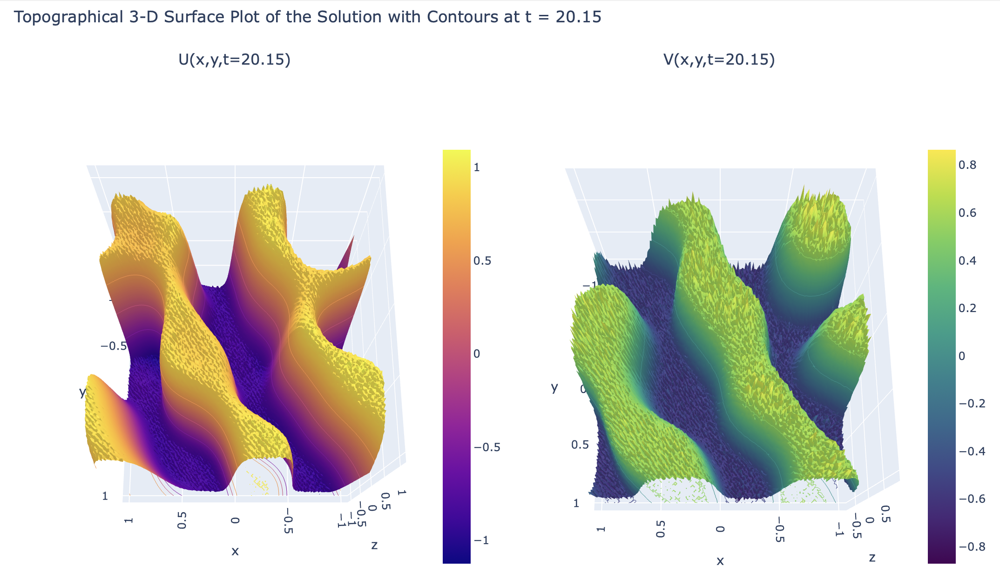

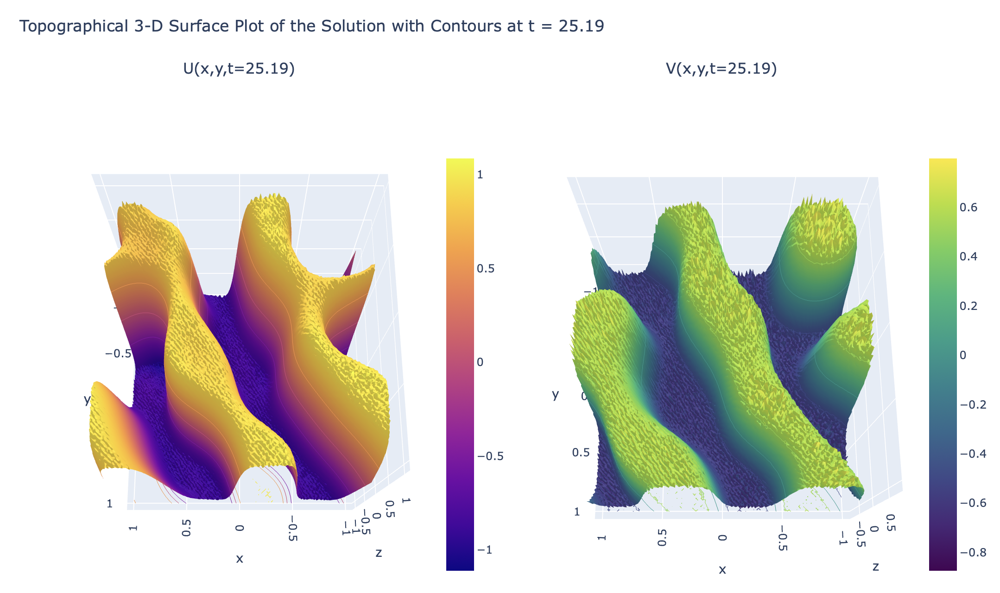

In [4]:
# define time_intervals
time_intervals = []
for i in range(len(data)):
    time_intervals.append(data[i][3])


def extract_data(time):
    j = time_intervals.index(time)
    z_data0 = data[j][2]
    z_data1 = data[j][4]
 
    return z_data0, z_data1
    
def update_plot(time):
    
    z_data0 = extract_data(time)[0]
    z_data1 = extract_data(time)[1]
    z_data0 = z_data0.reshape((150, 150))
    z_data1 = z_data1.reshape((150, 150))

    # initialize figure with 2 subplots
    fig = make_subplots(
        rows=1, cols=2, 
        subplot_titles=("U(x,y,t={})".format(round(time, 2)), "V(x,y,t={})".format(round(time, 2))),
         specs=[[{'type': 'surface'}, {'type': 'surface'}]])


    # set up grid
    m = 150
    delta_x = 2.0 / m
    x = numpy.linspace(-1.0, 1.0, m)
    y = numpy.linspace(-1.0, 1.0, m)
    Y, X = numpy.meshgrid(y, x)
    
    # add surfaces to subplots.
    fig.add_trace(
        go.Surface(x=x, y=y, z=z_data0, colorscale='Plasma', colorbar=dict(x=0.45, len=0.75)),
        row=1, col=1)
    
    fig.add_trace(
        go.Surface(x=x, y=y, z=z_data1, colorscale='Viridis', colorbar=dict(x=1, len=0.75)),
        row=1, col=2)


    # update layout for the entire figure
    fig.update_layout(title_text='Topographical 3-D Surface Plot of the Solution with Contours at t = {}'.format(round(time, 2)),
                        height=800,
                        width=None,
                        scene=dict(
                        camera=dict(eye=dict(x=0, y=.8, z=2.5))  # camera angle for the first plot
                        ),
                        scene2=dict(
                        camera=dict(eye=dict(x=0, y=.8, z=2.5))  # camera angle for the second plot
                        ))
    fig.show()


#for i in time_intervals:
#    update_plot(i) 
    
display(Image(filename='diffusion_reaction_pics/1.png'))
display(Image(filename='diffusion_reaction_pics/2.png'))
display(Image(filename='diffusion_reaction_pics/3.png'))
display(Image(filename='diffusion_reaction_pics/4.png'))
display(Image(filename='diffusion_reaction_pics/5.png'))
display(Image(filename='diffusion_reaction_pics/6.png'))
display(Image(filename='diffusion_reaction_pics/7.png'))
            
# time_slider = SelectionSlider(options=time_intervals, value=time_intervals[5], description='Time')
# interact(update_plot, time=time_slider);

**Analysis of figure:** There is an inverse correlation between the solutions $U(x,y,t)$ and $V(x,y,t)$; areas with elevated 
$U(x,y,t)$ correspond to reduced $V(x,y,t)$, and regions with decreased $U(x,y,t)$ coincide with increased $V(x,y,t)$. This is sort of behavior, where high concentrations of one chemical coincide with low concentrations of another chemical, and vice versa, can be a feature of specific chemical reactions characterized by certain interaction dynamics.

**Note:** The implicit-explicit method is expected to have second-order convergence in space and first-order convergence in time. However, numerical convergence analysis is difficult without an analytic solution.

### References

[1] Ketcheson, D. (n.d.). Finite Difference Course. GitHub. Retrieved July 27, 2024, from https://github.com/ketch/finite-difference-course

[2] LeVeque, R. J. (2007). Finite Difference Methods for Ordinary and Partial Differential Equations: Steady State and Time Dependent Problems. Society for Industrial and Applied Mathematics (SIAM).

[3] <a id="ref1"></a> Mandli, K. T. (n.d.). Reaction-Diffusion Demo. In Numerical Methods for Partial Differential Equations [Jupyter Notebook]. GitHub. Retrieved July 27, 2024, from https://github.com/mandli/numerical-methods-pdes/blob/master/reaction-diffusion_demo.ipynb

